# ATB Electricity 2024

In this notebook, we demonstrate how to access and visualize the 2024 ATB electricity data from AWS S3 storage.

The following site-packages are required for this notebook:

* jupyter
* pyarrow
* pandas
* matplotlib
* ipympl (for interactive visualization)

## 1 Introduction

The ATB Electricity data sets from 2019 through 2024 are managed by the [Open Energy Data Initiative](https://openei.org/wiki/Open_Energy_Data_Initiative_(OEDI)) and stored in the [OEDI Data Lake](https://data.openei.org/s3_viewer?bucket=oedi-data-lake&prefix=ATB%2Felectricity%2F) on AWS. For more information about the ATB, please refer to our website, [https://atb.nlr.gov/](https://atb.nlr.gov/).

### 1.1 Import Data

The first step in this notebook is to import the 2024 data into a Pandas dataframe.

In [2]:
import pandas as pd

url = 'https://oedi-data-lake.s3.amazonaws.com/ATB/electricity/parquet/2024/v4.0.0/ATBe.parquet'
raw_data = pd.read_parquet(url)
raw_data = raw_data.astype(
    dtype = {
        'core_metric_key': 'string',
        'core_metric_parameter': 'string',
        'core_metric_case': 'string',
        'crpyears': 'string',
        'technology': 'string',
        'technology_alias': 'string',
        'techdetail': 'string',
        'techdetail2': 'string',
        'resourcedetail': 'string',
        'display_name': 'string',
        'scale': 'string',
        'maturity': 'string',
        'scenario': 'string',
        'units': 'string'
    }
)
print('Columns: \n')
print(raw_data.dtypes)

Columns: 

atb_year                          int64
core_metric_key          string[python]
core_metric_parameter    string[python]
core_metric_case         string[python]
tax_credit_case                  object
crpyears                 string[python]
technology               string[python]
technology_alias         string[python]
techdetail               string[python]
techdetail2              string[python]
resourcedetail           string[python]
display_name             string[python]
default                           int64
scale                    string[python]
maturity                 string[python]
scenario                 string[python]
core_metric_variable              int64
units                    string[python]
value                           float64
dtype: object


### 1.2 Explore Data

A Pandas dataframe has great functionality for exploring and filtering the data.

In [3]:
from pprint import pprint

print('Here are all of the parameters present in this dataset:\n')
pprint(list(raw_data['core_metric_parameter'].unique()))

print('\nHere are all of the technologies:\n')
pprint(list(raw_data['technology'].unique()))

Here are all of the parameters present in this dataset:

['Fixed O&M',
 'CFC',
 'LCOE',
 'CAPEX',
 'CF',
 'OCC',
 'GCC',
 'Variable O&M',
 'Heat Rate',
 'Fuel',
 'Additional OCC',
 'Heat Rate Penalty',
 'Net Output Penalty',
 'FCR',
 'Inflation Rate',
 'Interest Rate Nominal',
 'Rate of Return on Equity Nominal',
 'Calculated Interest Rate Real',
 'Interest During Construction - Nominal',
 'Calculated Rate of Return on Equity Real',
 'Debt Fraction',
 'Tax Rate (Federal and State)',
 'WACC Nominal',
 'WACC Real',
 'CRF']

Here are all of the technologies:

['OffShoreWind',
 'Utility-Scale PV-Plus-Battery',
 'Hydropower',
 'Pumped Storage Hydropower',
 'Coal_FE',
 'NaturalGas_FE',
 'Biopower',
 'Utility-Scale Battery Storage',
 'Commercial Battery Storage',
 'Residential Battery Storage',
 'Coal_Retrofits',
 'NaturalGas_Retrofits',
 'LandbasedWind',
 'DistributedWind',
 'CSP',
 'UtilityPV',
 'CommPV',
 'ResPV',
 'Geothermal',
 'Nuclear']


We can drill down and see all of the available details for a given technology.

In [4]:
tech = 'OffShoreWind'   # Plug in any tech from the list above.
raw_data.loc[raw_data['technology'] == tech, ['technology', 'techdetail', 'techdetail2', 'resourcedetail', 'scale', 'maturity']].drop_duplicates()

,technology,techdetail,techdetail2,resourcedetail,scale,maturity
0,OffShoreWind,Class3,Fixed-Bottom,Class3,Utility,Y
1702,OffShoreWind,Class4,Fixed-Bottom,Class4,Utility,Y
4147,OffShoreWind,Class5,Fixed-Bottom,Class5,Utility,Y
6342,OffShoreWind,Class6,Fixed-Bottom,Class6,Utility,Y
6842,OffShoreWind,Class1,Fixed-Bottom,Class1,Utility,Y
6845,OffShoreWind,Class2,Fixed-Bottom,Class2,Utility,Y
6861,OffShoreWind,Class7,Fixed-Bottom,Class7,Utility,Y
57722,OffShoreWind,Class8,Floating,Class8,Utility,N
57725,OffShoreWind,Class9,Floating,Class9,Utility,N
57728,OffShoreWind,Class10,Floating,Class10,Utility,N


### 1.3 Simple plot

Next, let's make a simple plot to see the projected levelized cost of energy for land based wind power (class 10). In this dataset, 'core_metric_variable' corresponds to year in this time series data.

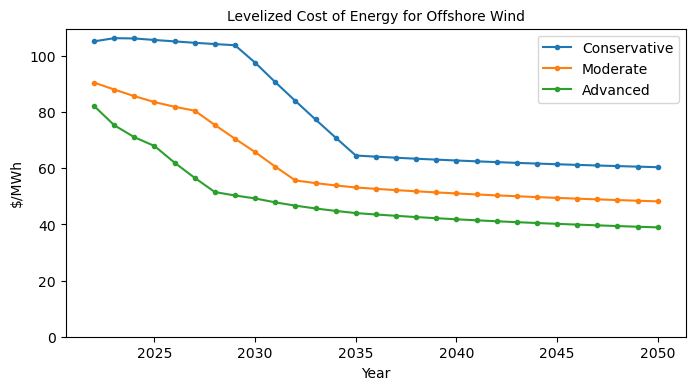

In [5]:
import matplotlib.pyplot as plt

df = raw_data[
    (raw_data['core_metric_parameter'] == 'LCOE') &
    (raw_data['core_metric_case'] == 'Market') &
    (raw_data['crpyears'] == '30') &
    (raw_data['technology'] == 'OffShoreWind') &
    (raw_data['techdetail'] == 'Class1') &
    (raw_data['techdetail2'] == 'Fixed-Bottom') &
    (raw_data['tax_credit_case'] == 'ITC') &
    (raw_data['maturity'] == 'Y')
].sort_values(by='core_metric_variable')
units = df.units.iloc[0]
scenarios = ['Conservative', 'Moderate', 'Advanced']

fig = plt.figure(figsize=(8,4))
for scenario in scenarios:
    plt.plot(
        df[df['scenario'] == scenario]['core_metric_variable'],
        df[df['scenario'] == scenario]['value'],
        figure = fig,
        marker='.'
        )
plt.title('Levelized Cost of Energy for Offshore Wind', size=10)
plt.xlabel('Year', size=10)
plt.ylabel(units, size=10)
plt.ylim(bottom=0)
plt.legend(scenarios)
plt.show()

# 2 Financial Data

## 2.1 Filtering

Let's capture all the financial data. Note that 'core_metric_variable' is actually the year in this time series data, and 'value' is the value of the 'core_metric_parameter' given as a decimal rate.

In [6]:
# Select columns of interest
df = raw_data[
    [
        'core_metric_parameter',
        'core_metric_case',
        'crpyears',
        'technology',
        'scenario',
        'core_metric_variable',
        'value'
    ]
]

# Select rows that correspond to the financial parameters
df = df[
    df['core_metric_parameter'].isin(
        [
            'Calculated Rate of Return on Equity Real',
            'Calculated Interest Rate Real',
            'Debt Fraction',
            'FCR',
            'Interest Rate Nominal',
            'Rate of Return on Equity Nominal',
            'WACC Nominal',
            'WACC Real'
        ]
    )
]

# Additional filtering and sorting
df = df[
    (df.crpyears.isin(['30','*'])) &
    (df.scenario == 'Moderate')
    ]
df = df.sort_values(by='core_metric_variable')

display(df.style.format(na_rep="None"))

,core_metric_parameter,core_metric_case,crpyears,technology,scenario,core_metric_variable,value
519261,Interest Rate Nominal,Market,30,Utility-Scale PV-Plus-Battery,Moderate,2022,0.070000
517770,FCR,Market,30,ResPV,Moderate,2022,0.042270
517771,FCR,Market,30,ResPV,Moderate,2022,0.042270
517772,FCR,Market,30,ResPV,Moderate,2022,0.042270
517773,FCR,Market,30,ResPV,Moderate,2022,0.042270
517774,FCR,Market,30,ResPV,Moderate,2022,0.042270
517775,FCR,Market,30,ResPV,Moderate,2022,0.042270
517776,FCR,Market,30,ResPV,Moderate,2022,0.042270
516921,FCR,R&D,30,CommPV,Moderate,2022,0.058287
517777,FCR,Market,30,ResPV,Moderate,2022,0.042270


## 2.2 Interactive Visualization

Now that we have a dataframe of the financials, we can build interactive plots using ipywidgets. We also add functionality for the user to export their data selection as a .csv.

Box(children=(Dropdown(description='Parameter:', options=('Interest Rate Nominal', 'FCR', 'Calculated Interest…

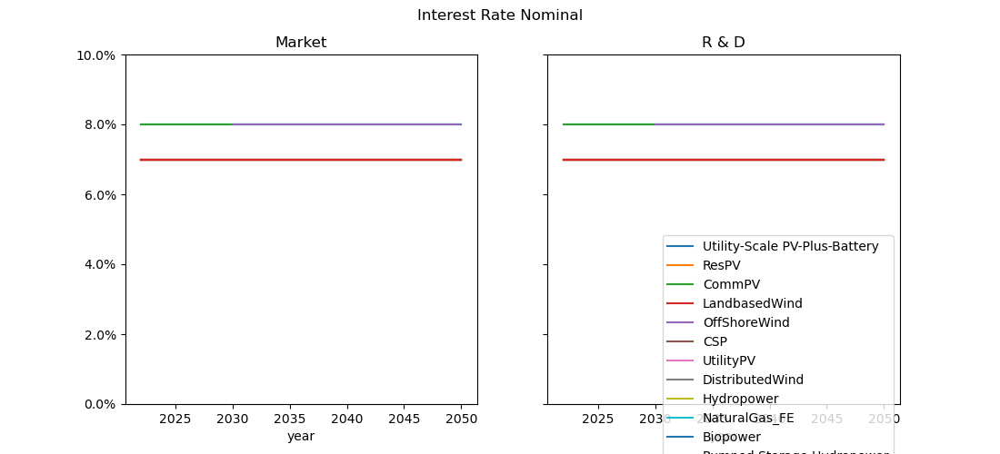

Box(children=(Button(description='Export Selection to .csv', layout=Layout(height='50px', width='200px'), styl…

In [7]:
%matplotlib ipympl
from ipywidgets import Dropdown, widgets, Button, Layout, SelectMultiple, Output, Text, Output, Box, Layout
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import numpy as np
from math import ceil

# Create output widget
out = Output(layout=widgets.Layout(height='300px'))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (11,5), sharey = True)

def init_plot():
    fig.suptitle(core_metric_parameter_W.value)
    df_f = df[
        (df['core_metric_parameter'] == core_metric_parameter_W.value) &
        (df['technology'].isin(technology_W.value))
        #(df['tax_credit_case'] == tax_credit_cases_W.value if tax_credit_cases_W.value != "None" else df['tax_credit_case'].isna() )
    ]
    df_market = df_f[df_f['core_metric_case'] == 'Market']
    df_RandD = df_f[df_f['core_metric_case'] == 'R&D']
    
    # Plot the data
    fig.suptitle(core_metric_parameter_W.value)
    for tech in technology_W.options:
        market_artist = df_market[df_market['technology'] == tech].plot(x = 'core_metric_variable', y = 'value', ax = ax1, xlabel = 'year', title = 'Market')
        RandD_artist = df_RandD[df_RandD['technology'] == tech].plot(x = 'core_metric_variable', y = 'value', ax = ax2, xlabel = 'year', title = 'R & D')
    ax1.get_legend().remove()
    ax1.set_ylim(ymin = 0, ymax = ymax[core_metric_parameter_W.value])
    ax1.yaxis.set_major_formatter(mtick.PercentFormatter(1.0)) # Converts the decimal rate value to be displayed as a percentage
    ax2.legend(technology_W.value, loc='best', bbox_to_anchor=(1, 0.5))
    #fig.tight_layout()
    plt.show()

def update_plot(w):
    # Without clear_output(), figures get appended below each other inside
    # the output widget
    # Ah ha! Got it! I need wait=True!
    #out.clear_output(wait=True)
    #plt.plot(x, x**p_widget.value)
    
    # Filter the df based on the user's choices in the dropdowns
    df_f = df[
        (df['core_metric_parameter'] == core_metric_parameter_W.value) &
        (df['technology'].isin(technology_W.value))
        #(df['tax_credit_case'] == tax_credit_cases_W.value if tax_credit_cases_W.value != "None" else df['tax_credit_case'].isna() )
    ]
    df_market = df_f[df_f['core_metric_case'] == 'Market']
    df_RandD = df_f[df_f['core_metric_case'] == 'R&D']
    
    # Plot the data
    line_handles = []
    fig.suptitle(core_metric_parameter_W.value)
    for ax,tmp_df in zip([ax1,ax2],[df_market,df_RandD]):
        for tech,line in zip(technology_W.options,ax.lines):
            if(tech in technology_W.value):
                [x,y] = [tmp_df[tmp_df['technology'] == tech][i] for i in ['core_metric_variable','value']]
                line.set_data(x,y)
                line.set_visible(True)
                line_handles.append(line)
            else:
                line.set_visible(False)

    ax2.legend(line_handles,technology_W.value, loc='best', bbox_to_anchor=(1, 0.5))
    ax1.set_ylim(ymin = 0, ymax = ymax[core_metric_parameter_W.value])
    fig.canvas.draw()
    fig.canvas.flush_events()

# Get unique values for user controls
core_metric_parameter = df['core_metric_parameter'].unique()
technology_options = df['technology'].unique()
#tax_credit_cases = np.append(df['tax_credit_case'][df['tax_credit_case'].notna()].unique(),"None")

# Find a reasonable maximum value for the y-axis for each core_metric_parameter
ymax = {}
for metric in core_metric_parameter:
    ymax[metric] = ceil((df[df['core_metric_parameter'] == metric]['value'].max() + .01) * 10)/10

# Make widgets
core_metric_parameter_W = Dropdown(options = core_metric_parameter, description='Parameter:')
technology_W = SelectMultiple(options = technology_options, value=(*technology_options,), description='Technology:')
#tax_credit_cases_W = Dropdown(options = tax_credit_cases, description='Tax Credit Case: ')

#update_plot([])
core_metric_parameter_W.observe(update_plot)
technology_W.observe(update_plot)
#tax_credit_cases_W.observe(update_plot)
box_layout = Layout()
filter_box = Box(children=[core_metric_parameter_W, technology_W], layout=box_layout)
display(filter_box)
init_plot()

## Now we set up widgets to facilitate exporting the data to a file
# Text widget for export filename
filename_W = Text(
    value='ATB_filtered_financials.csv',
    description='File Name:',
    disabled=False
)

# Make and style a Button widget to trigger data export
button = Button(description="Export Selection to .csv", layout = Layout(width = '200px', height = '50px'))
button.style.button_color = 'green'

# Set button action that will export the ATB dataset, filtered as per user's dropdown choices, once they click the button
def on_button_clicked(b):
    with out:
        # Filter the df based on the user's choices in the dropdowns
        df_f = df[
            (df['core_metric_parameter'] == core_metric_parameter_W.value) &
            (df['technology'].isin(technology_W.value)) 
            #(df['tax_credit_case'] == tax_credit_cases_W.value if tax_credit_cases_W.value != "None" else df['tax_credit_case'].isna() )
        ]
        df_f.to_csv(filename_W.value)
        print("CSV Export Successful!")

# Display button and link to action
export_box = Box(children=[button, filename_W], layout=box_layout)
display(export_box)
button.on_click(on_button_clicked)

# 3 Core Metrics
## 3.1 Run Query
Next, let's make a new dataframe by querying the core metrics.

In [8]:
df_CM = raw_data[[
    'core_metric_parameter',
    'core_metric_case',
    'crpyears',
    'technology',
    'techdetail',
    'techdetail2',
    'scenario',
    'tax_credit_case',
    'units',
    'core_metric_variable',
    'value'
]]

df_CM = df_CM[df_CM['core_metric_parameter'].isin([
    'LCOE',
    'CAPEX',
    'CF',
    'Fixed O&M',
    'Variable O&M'
])]

df_CM = df_CM.sort_values(by=['technology', 'techdetail', 'core_metric_variable'])
df_CM['techdetail_combined'] = df_CM['techdetail'] + ' - ' + df_CM['techdetail2']

df_CM.head(20)

,core_metric_parameter,core_metric_case,crpyears,technology,techdetail,techdetail2,scenario,tax_credit_case,units,core_metric_variable,value,techdetail_combined
76023,CF,Market,20,Biopower,Dedicated,Biopower,Advanced,PTC,,2022,0.600000,Dedicated - Biopower
76034,CF,Market,20,Biopower,Dedicated,Biopower,Moderate,PTC,,2022,0.600000,Dedicated - Biopower
76045,CF,Market,20,Biopower,Dedicated,Biopower,Conservative,PTC,,2022,0.600000,Dedicated - Biopower
76123,Fixed O&M,Market,20,Biopower,Dedicated,Biopower,Advanced,PTC,$/kW-yr,2022,163.666020,Dedicated - Biopower
76134,Fixed O&M,Market,20,Biopower,Dedicated,Biopower,Moderate,PTC,$/kW-yr,2022,163.666020,Dedicated - Biopower
76143,Fixed O&M,Market,20,Biopower,Dedicated,Biopower,Conservative,PTC,$/kW-yr,2022,163.666020,Dedicated - Biopower
76144,Variable O&M,Market,20,Biopower,Dedicated,Biopower,Advanced,PTC,$/MWh,2022,5.246640,Dedicated - Biopower
76145,Variable O&M,Market,20,Biopower,Dedicated,Biopower,Moderate,PTC,$/MWh,2022,5.246640,Dedicated - Biopower
76149,Variable O&M,Market,20,Biopower,Dedicated,Biopower,Conservative,PTC,$/MWh,2022,5.246640,Dedicated - Biopower
76193,LCOE,Market,20,Biopower,Dedicated,Biopower,Advanced,PTC,$/MWh,2022,195.529792,Dedicated - Biopower


## 3.2 Interactive Visualization

Just like before, once we have a dataframe, we can use ipywidgets to build visualizations and export functionality.

GridspecLayout(children=(Dropdown(description='Technology', layout=Layout(grid_area='widget001'), options=('Bi…

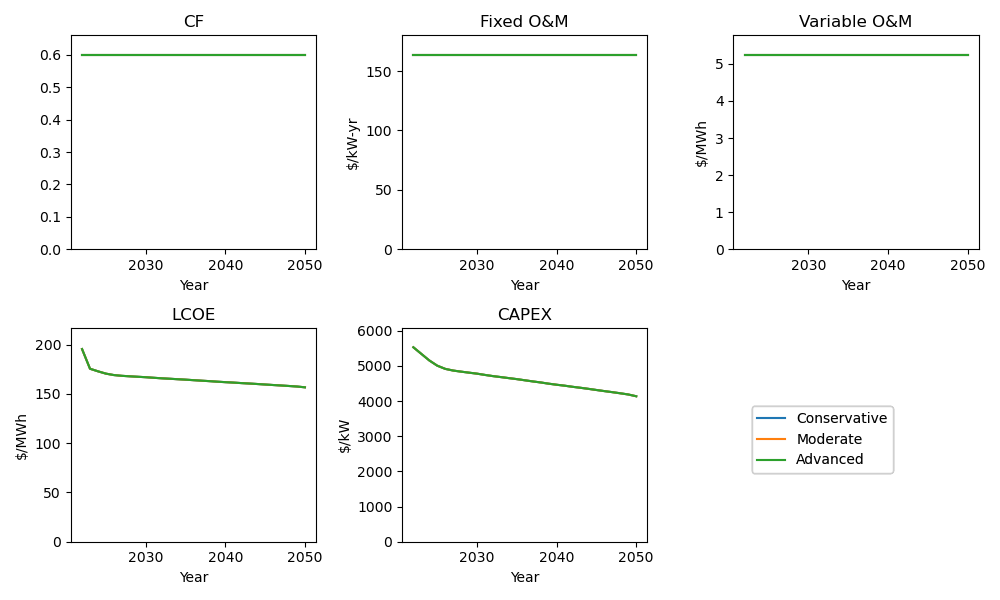

Box(children=(Button(description='Export Selection to .csv', layout=Layout(height='50px', width='200px'), styl…

In [9]:
%matplotlib ipympl
from ipywidgets import Dropdown, widgets, Button, Text, Output, Box, Layout, GridspecLayout
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import numpy as np
from math import ceil

# Turn to 'True' for debugging purposes
debug = False

# Create output widget
out = Output(layout=widgets.Layout(height='200px'))
out_debug = Output(layout=widgets.Layout(height='200px'))

fig, ((ax1,ax2,ax3),(ax4,ax5,ax6)) = plt.subplots(2, 3, figsize = (10,6))

@out_debug.capture()
def update_plot(w):
    #with out:

        #out.clear_output(wait=True)

    # Filter the df based on the user's choices in the dropdowns
    df_CM_f = df_CM[
        (df_CM['technology'] == technology_W.value) &
        (df_CM['core_metric_case'] == case_W.value) &
        (df_CM['crpyears'] == crpyears_W.value) &
        (df_CM['techdetail_combined'] == tech_detail_W.value) &
        (df_CM['tax_credit_case'].isna() if tax_credit_case_W.value == 'None' else df_CM['tax_credit_case'] == tax_credit_case_W.value)
    ]

    # Plot the data in a grid
    axes = iter([ax1, ax2, ax3, ax4, ax5])
    ax6.set_axis_off()
    for cmp in core_metric_parameters:
        ax = next(axes)
        ax.set_ylim(ymin = 0, ymax = ymax[technology_W.value][cmp])
        if not w: #Initialize plots
            for scenario in scenarios:
                df_CM_f[(df_CM_f['core_metric_parameter'] == cmp) & (df_CM_f['scenario'] == scenario)].plot(
                    x = 'core_metric_variable',
                    y = 'value', ax = ax,
                    xlabel = 'Year',
                    ylabel = ylabels[cmp],
                    title = cmp,
                    label=scenario
                )
            fig.tight_layout()
            fig.legend(scenarios,loc='lower right',bbox_to_anchor=(.9,.2))
            if ax.get_legend(): ax.get_legend().remove()
        elif w['name'] == 'value': #Update plots
            for scenario,line in zip(scenarios,ax.lines):
                if scenario in scenario_W.value:
                    line.set(visible=True)
                    df_CM_f_sp = df_CM_f[(df_CM_f['core_metric_parameter'] == cmp) & (df_CM_f['scenario'] == scenario)]
                    x,y = df_CM_f_sp['core_metric_variable'],df_CM_f_sp['value']
                    line.set_data(x,y)
                else:
                    line.set(visible=False)   
    if w and ['name'] == 'value':
        fig.canvas.draw()
        fig.canvas.flush_events()
        print(f"called with w={w}")

# Get unique values for user controls
core_metric_parameters = df_CM.core_metric_parameter.unique()
technology_options = df_CM.technology.unique()
case_options = df_CM.core_metric_case.unique()

# List of scenarios for filtering and legend
scenarios = ['Conservative', 'Moderate', 'Advanced']

# Create dictionary of max values for the y-scales in the plots based on technology and core_metric_parameter
ymax = {}
for tech in technology_options:
    ymax[tech] = {}
    for metric in core_metric_parameters:
        x = df_CM[(df_CM['core_metric_parameter'] == metric) & (df_CM['technology'] == tech)].value.max()
        if np.isnan(x) or x == 0:
            ymax[tech][metric] = 1
        else:
            ymax[tech][metric] = x * 1.1

# Create dictionary of units to label the y-axes
ylabels = {}
for metric in core_metric_parameters:
    units = df_CM[df_CM['core_metric_parameter'] == metric].iloc[0]['units']
    if type(units) == str:
        ylabels[metric] = units
    else:
        ylabels[metric] = ''

# The options for crpyears and tech_detail depend on which technology is selected. We need to make these
# widgets update based on the technology_W widget.
crpyears_dict = {}
tech_detail_dict = {}
tax_credit_case_dict = {}
for tech in technology_options: 
    df_tech = df_CM[df_CM['technology'] == tech]
    crpyears_dict[tech] = list(df_tech['crpyears'].unique())
    tech_details = list(df_tech['techdetail_combined'].unique())
    tech_detail_dict[tech] = tech_details
    for tech_detail in tech_details:
        tax_credit_case_dict[(tech,tech_detail)] = list(map(lambda l: "None" if pd.isna(l) else l,df_tech[df_tech['techdetail_combined'] == tech_detail]['tax_credit_case'].unique()))

# Make widgets
technology_W = Dropdown(options = technology_options, description='Technology')
tech_detail_W = Dropdown(options = tech_detail_dict[technology_W.value], description='Tech Detail')
case_W = Dropdown(options = case_options, description='Case')
crpyears_W = Dropdown(options = crpyears_dict[technology_W.value], description='CRP')
tax_credit_case_W = Dropdown(options = tax_credit_case_dict[(technology_W.value,tech_detail_W.value)],description='Tax Credit')
scenario_W = widgets.SelectMultiple(options = scenarios, value = scenarios, description='Scenario')

@out_debug.capture()
def update_W_options(change):
    tech_detail = tech_detail_W.value
    tech = technology_W.value
    if change['owner'] is case_W and change['name'] == 'value' and change['new'] == 'R&D':
        print("selected R&D")
        tax_credit_case_W.value = 'None'
    if change['owner'] is technology_W and change['name'] == 'value':
        crpyears_W.options = crpyears_dict[tech]
        tech_detail_W.options = tech_detail_dict[tech]
        tech_detail = tech_detail_W.value
        print(f"updated tech. old: {change['old']}\tnew: {change['new']}\tvalue: {change['name']}")
    elif change['owner'] is tech_detail_W and change['name'] == 'value':
        tax_credit_case_W.options = tax_credit_case_dict[(tech,tech_detail)]
        print(f"updated tech_detail. old: {change['old']}\tnew: {change['new']}\tvalue: {change['name']}")
        print(f"new tax_credit_case options: {tax_credit_case_W.options}\nLookup on {(tech,tech_detail)}")
# Update techdetail/tax_credit_case options when user selects a technology/techdetail
technology_W.observe(update_W_options)
tech_detail_W.observe(update_W_options)
case_W.observe(update_W_options)

# Arrange control widgets into a grid format
grid = GridspecLayout(2,3,height='200px')
grid[0,0] = technology_W
grid[1,0] = tech_detail_W
grid[0,1] = crpyears_W
grid[1,1] = case_W
grid[0,2] = tax_credit_case_W
grid[1,2] = scenario_W

# Display widgets
display(grid)

# Update plot each time a filter is changed
update_plot([])
#display(out)
technology_W.observe(update_plot)
tech_detail_W.observe(update_plot)
case_W.observe(update_plot)
crpyears_W.observe(update_plot)
tax_credit_case_W.observe(update_plot)
scenario_W.observe(update_plot)
plt.show()


## Now we set up widgets to facilitate exporting the data to a file
# Text widget for export filename
filename_W = Text(
    value='ATB_filtered_core_metrics.csv',
    description='File Name:',
    disabled=False
)

# Make and style a Button widget to trigger data export
button = Button(description="Export Selection to .csv", layout = Layout(width = '200px', height = '50px'))
button.style.button_color = 'green'

# Set button action that will export the ATB dataset, filtered as per user's dropdown choices, once they click the button
def on_button_clicked(b):
    with out:
        # Filter the df based on the user's choices in the dropdowns
        df_out = df_CM[
            (df_CM['technology'] == technology_W.value) &
            (df_CM['techdetail_combined'] == tech_detail_W.value) &
            (df_CM['core_metric_case'] == case_W.value) &
            (df_CM['crpyears'] == crpyears_W.value) &
            (df_CM['tax_credit_case'] == tax_credit_case_W.value)
        ]
        df_out.to_csv(filename_W.value)
        print("CSV Export to local directory Successful!")

# Display button and link to action
export_box = Box(children=[button, filename_W])
display(export_box)
button.on_click(on_button_clicked)
if(debug):
    display(out_debug)